**Internship iNeuron project**

**submitted by - Mayank Deopa**

#                            Heart Disease Diagnostic Analysis

# Importing Required Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Extracting CSV Dataset From System using Pandas Library

In [2]:
df=pd.read_csv('heart_disease_uci.csv')
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [3]:
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [4]:
df.tail()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.0,NaN,NaN,NaN,1
916,917,62,Male,VA Long Beach,typical angina,NaN,139.0,False,st-t abnormality,NaN,NaN,NaN,NaN,NaN,NaN,0
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.0,NaN,NaN,fixed defect,2
918,919,58,Male,VA Long Beach,asymptomatic,NaN,385.0,True,lv hypertrophy,NaN,NaN,NaN,NaN,NaN,NaN,0
919,920,62,Male,VA Long Beach,atypical angina,120.0,254.0,False,lv hypertrophy,93.0,True,0.0,NaN,NaN,NaN,1


In [5]:
#Checking Not null values
df.info()

# We can see that majority of the variables are of int64 type and are non-null.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  861 non-null    float64
 6   chol      890 non-null    float64
 7   fbs       830 non-null    object 
 8   restecg   918 non-null    object 
 9   thalch    865 non-null    float64
 10  exang     865 non-null    object 
 11  oldpeak   858 non-null    float64
 12  slope     611 non-null    object 
 13  ca        309 non-null    float64
 14  thal      434 non-null    object 
 15  num       920 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 115.1+ KB


##### There are 14 features in Dataset

1) age: The person's age in years

2) sex: The person's sex (1 = male, 0 = female)

3) cp: The chest pain experienced (Value 1: typical angina, Value 2: atypical angina, Value 3: non-anginal pain, Value 4:          asymptomatic)

4) trestbps: The person's resting blood pressure (mm Hg on admission to the hospital)

5) chol: The person's cholesterol measurement in mg/dl

6) fbs: The person's fasting blood sugar (> 120 mg/dl, 1 = true; 0 = false)

7) restecg: Resting electrocardiographic measurement (0 = normal, 1 = having ST-T wave abnormality, 2 = showing probable or        definite left ventricular hypertrophy by Estes' criteria)

8) thalach: The person's maximum heart rate achieved

9) exang: Exercise induced angina (1 = yes; 0 = no)

10) oldpeak: ST depression induced by exercise relative to rest

11)slope: the slope of the peak exercise ST segment (Value 1: upsloping, Value 2: flat, Value 3: downsloping)

12)ca: The number of major vessels (0-3)

13)thal: A blood disorder called thalassemia (3 = normal; 6 = fixed defect; 7 = reversable defect)

14)num: Heart disease (0 = no, 1 = yes)

In [6]:
# On closer analysis of the dataset it is visible that there are some attributes which are classified as int64
# but they are categorical variables having a specific number of classes. Eg. sex, cp, slope etc.

In [7]:
df.shape

# The dataset contains 303 records and 14 different attributes / variables

(920, 16)

In [8]:
df.describe()

# The describe() function gives the statistical summary of the numberical columns of the dataset.

,id,age,trestbps,chol,thalch,oldpeak,ca,num
count,920.000000,920.000000,861.000000,890.000000,865.000000,858.000000,309.000000,920.000000
mean,460.500000,53.510870,132.132404,199.130337,137.545665,0.878788,0.676375,0.995652
std,265.725422,9.424685,19.066070,110.780810,25.926276,1.091226,0.935653,1.142693
min,1.000000,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,230.750000,47.000000,120.000000,175.000000,120.000000,0.000000,0.000000,0.000000
50%,460.500000,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000,1.000000
75%,690.250000,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000,2.000000
max,920.000000,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


# Percentage of people having Heart Disease


In [9]:
num=df.groupby('num').size()
num

num
0    411
1    265
2    109
3    107
4     28
dtype: int64

In [10]:
def heart_d(r):
    if r==0:
        return 'Absence'
    elif r==1:
        return 'Presence'

In [11]:
#Applying converted data into our dataset with new column - Heart_Disease

df['Heart_Disease']=df['num'].apply(heart_d)
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0,Absence
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2,None
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1,Presence
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0,Absence
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0,Absence


In [12]:
hd=df.groupby('Heart_Disease')['num'].count()
hd

Heart_Disease
Absence     411
Presence    265
Name: num, dtype: int64

In [13]:
#Converting Numerical Data into Categorical Data

def gen(r):
    if r==1:
        return 'Male'
    elif r==0:
        return 'Female'

In [14]:
#Applying converted data into our dataset with new column - sex1

df['sex1']=df['sex'].apply(gen)
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0,Absence,None
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2,None,None
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1,Presence,None
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0,Absence,None
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0,Absence,None


In [15]:
#Converting Numerical Data into Categorical Data

def age_rng(r):
    if r>=29 and r<40:
        return 'Young Age'
    elif r>=40 and r<55:
        return 'Middle Age'
    elif r>55:
        return 'Elder Age'

In [16]:
#Applying converted data into our dataset with new column - Age_Range

df['Age_Range']=df['age'].apply(age_rng)
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1,Age_Range
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0,Absence,None,Elder Age
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2,None,None,Elder Age
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1,Presence,None,Elder Age
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0,Absence,None,Young Age
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0,Absence,None,Middle Age


# Exploratory Data Analysis

In [17]:
!pip install pandas-profiling

  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=325308bf9d604424a4c9ccefef1151d1d90d61f2b5c25934a53d927a9eb9b935
  Stored in directory: c:\users\lenovo\appdata\local\pip\cache\wheels\1d\05\04\c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Uninstalling typing-extensions-4.1.1:
      Successfully uninstalled typing-extensions-4.1.1


In [18]:
from pandas_profiling import ProfileReport

C:\Users\lenovo\AppData\Local\Temp\ipykernel_7884\2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [19]:
prof=ProfileReport(df,title="Heart_Dataset_Profile_Report_Before_Cleanup.html", html={'style':{'fullwidth':True}})

In [20]:
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#  Data Transformation

In [21]:
# We calculate the median and mode of ca and thal columns to be replaced in place of -100000.
# From below calculation, we come to know that median and mode for both 'ca' and 'thal' are 0.0 and 3.0
# So we will replace the -100000 with 0.0 in 'ca' and 3.0 in 'thal'

In [22]:
df.median()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_7884\530051474.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.median()


id          460.5
age          54.0
trestbps    130.0
chol        223.0
fbs           0.0
thalch      140.0
exang         0.0
oldpeak       0.5
ca            0.0
num           1.0
sex1          NaN
dtype: float64

In [23]:
# replacing 0 in 'ca' where value = -100000

ca_median = int(df['ca'].median())
df.loc[df.ca == -100000, 'ca'] = np.nan
df.fillna(ca_median,inplace=True)

In [24]:
df['ca']

0      0.0
1      3.0
2      2.0
3      0.0
4      0.0
      ... 
915    0.0
916    0.0
917    0.0
918    0.0
919    0.0
Name: ca, Length: 920, dtype: float64

In [ ]:
#Checking Data Types

In [27]:
df.dtypes

id                 int64
age                int64
sex               object
dataset           object
cp                object
trestbps         float64
chol             float64
fbs               object
restecg           object
thalch           float64
exang             object
oldpeak          float64
slope             object
ca               float64
thal              object
num                int64
Heart_Disease     object
sex1               int64
Age_Range         object
dtype: object

In [28]:
# Converting the numeric columns to categorical 

df = df.astype({"sex":'category', 
                                "cp":'category',
                                "fbs":'category',
                                "restecg":'category', 
                                "exang":'category',
                                "slope":'category',
                                "ca":'category', 
                                "thal":'category',
                                "num":'category'})

In [29]:
df.dtypes

id                  int64
age                 int64
sex              category
dataset            object
cp               category
trestbps          float64
chol              float64
fbs              category
restecg          category
thalch            float64
exang            category
oldpeak           float64
slope            category
ca               category
thal             category
num              category
Heart_Disease      object
sex1                int64
Age_Range          object
dtype: object

In [30]:
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1,Age_Range
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0,Absence,0,Elder Age
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2,0,0,Elder Age
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1,Presence,0,Elder Age
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0,Absence,0,Young Age
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0,Absence,0,Middle Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.0,0,0.0,0,1,Presence,0,Middle Age
916,917,62,Male,VA Long Beach,typical angina,0.0,139.0,False,st-t abnormality,0.0,False,0.0,0,0.0,0,0,Absence,0,Elder Age
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.0,0,0.0,fixed defect,2,0,0,0
918,919,58,Male,VA Long Beach,asymptomatic,0.0,385.0,True,lv hypertrophy,0.0,False,0.0,0,0.0,0,0,Absence,0,Elder Age


In [31]:
df.dtypes[df.dtypes=='category']

sex        category
cp         category
fbs        category
restecg    category
exang      category
slope      category
ca         category
thal       category
num        category
dtype: object

In [32]:
df.describe()  
# After changing datatypes, only numeric values are reflected in summary because describe function summarizes only numeric data

,id,age,trestbps,chol,thalch,oldpeak,sex1
count,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,920.0
mean,460.500000,53.510870,123.658696,192.636957,129.322826,0.819565,0.0
std,265.725422,9.424685,37.271507,114.559993,41.188612,1.076582,0.0
min,1.000000,28.000000,0.000000,0.000000,0.000000,-2.600000,0.0
25%,230.750000,47.000000,120.000000,164.000000,115.000000,0.000000,0.0
50%,460.500000,54.000000,130.000000,221.000000,138.000000,0.200000,0.0
75%,690.250000,60.000000,140.000000,267.000000,156.000000,1.500000,0.0
max,920.000000,77.000000,200.000000,603.000000,202.000000,6.200000,0.0


In [33]:
# Boxplot before outlier treatment for proper visualization of the outliers and how far are they from mean 

{'whiskers': [<matplotlib.lines.Line2D at 0x2487de32af0>,
 'caps': [<matplotlib.lines.Line2D at 0x2487de3a190>,
 'boxes': [<matplotlib.lines.Line2D at 0x2487de32820>],
 'medians': [<matplotlib.lines.Line2D at 0x2487de3a670>],
 'fliers': [<matplotlib.lines.Line2D at 0x2487de3a940>],
 'means': []}

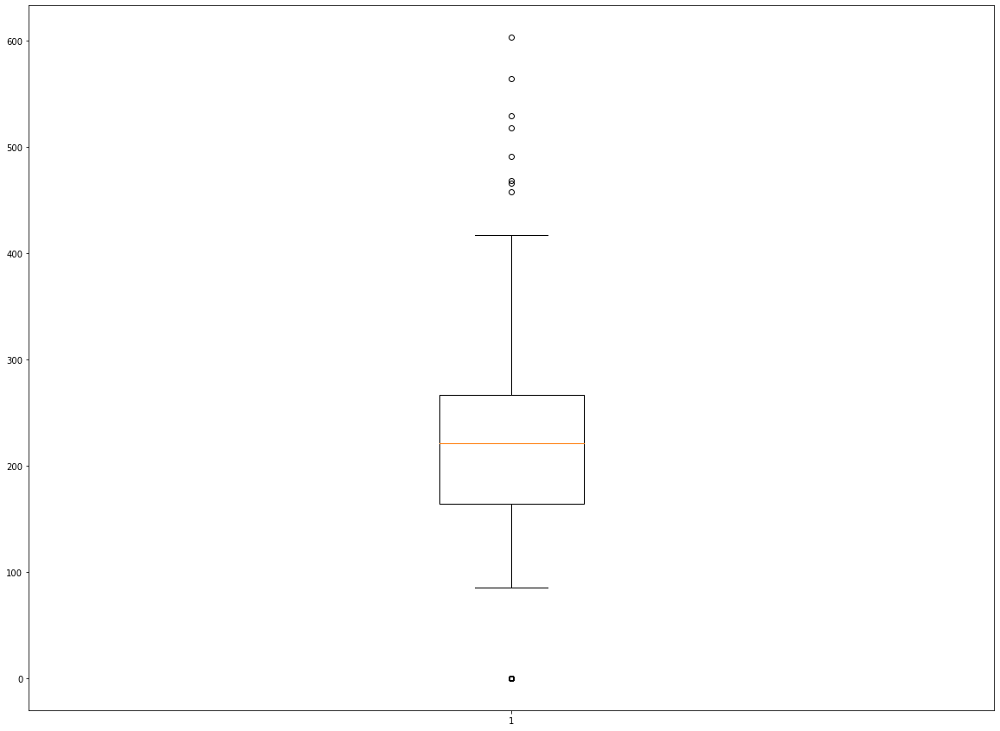

In [34]:
plt.subplots(figsize=(20,15))
plt.boxplot(data=df, x='chol')

In [35]:
df['chol'].mean()

192.63695652173914

In [36]:
#Detecting Outliers using Inter Quartile Range
#Finding The data located in First Quartile and Third Quartile
#If the data point significantly differs from other cluster of data points then removing the data point

In [37]:
outliers_chol = []
def Find_Outliers(data):
    data = sorted(data)
    Q1 = np.percentile(data,25)
    Q3 = np.percentile(data,75)
 
    IQR = Q3-Q1
    l_bound = Q1-(1.5*IQR)
    u_bound = Q3+(1.5*IQR)
   
    for j in data: 
        if (j < l_bound or j > u_bound):
            outliers_chol.append(j)
    return outliers_chol

outliers_chol = Find_Outliers(df['chol'])
print("Outliers from IQR method for chol column: ", outliers_chol)

Outliers from IQR method for chol column:  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [38]:
#Replacing the outliers in the chol column with the mean

In [39]:
for i in outliers_chol:
    df['chol'] = np.where(df['chol'] == i, df['chol'].mean(), df['chol'])

In [40]:
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1,Age_Range
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0,Absence,0,Elder Age
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2,0,0,Elder Age
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1,Presence,0,Elder Age
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0,Absence,0,Young Age
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0,Absence,0,Middle Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.0,0,0.0,0,1,Presence,0,Middle Age
916,917,62,Male,VA Long Beach,typical angina,0.0,139.0,False,st-t abnormality,0.0,False,0.0,0,0.0,0,0,Absence,0,Elder Age
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.0,0,0.0,fixed defect,2,0,0,0
918,919,58,Male,VA Long Beach,asymptomatic,0.0,385.0,True,lv hypertrophy,0.0,False,0.0,0,0.0,0,0,Absence,0,Elder Age


{'whiskers': [<matplotlib.lines.Line2D at 0x2487de656a0>,
 'caps': [<matplotlib.lines.Line2D at 0x2487de65c40>,
 'boxes': [<matplotlib.lines.Line2D at 0x2487de653d0>],
 'medians': [<matplotlib.lines.Line2D at 0x2487de6c220>],
 'fliers': [<matplotlib.lines.Line2D at 0x2487de6c4f0>],
 'means': []}

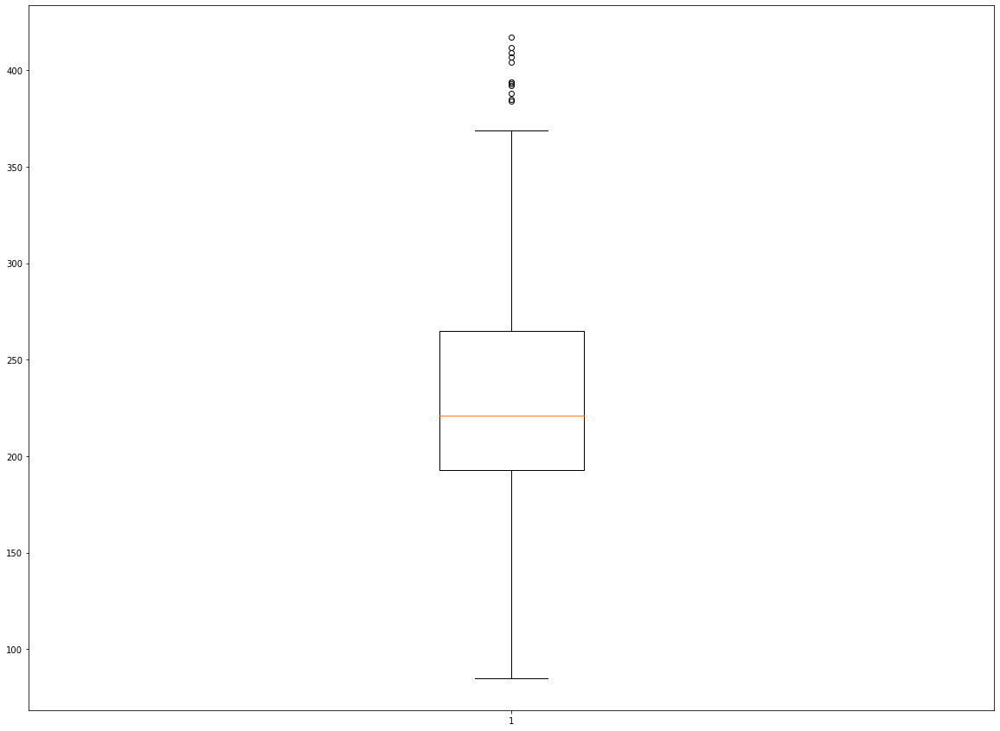

In [41]:
# Boxplot after removing outlier 

plt.subplots(figsize=(20,15))
plt.boxplot(data=df, x='chol')

In [42]:
# Replacing zeros with mean in 'oldpeak' column

In [43]:
df['oldpeak']

0      2.3
1      1.5
2      2.6
3      3.5
4      1.4
      ... 
915    0.0
916    0.0
917    0.0
918    0.0
919    0.0
Name: oldpeak, Length: 920, dtype: float64

In [44]:
df['oldpeak'] = np.where(df['oldpeak'] == 0, df['oldpeak'].mean(), df['oldpeak'])

In [45]:
# Checking the oldpeak column after replacing zeros with mean

In [46]:
df['oldpeak']

0      2.300000
1      1.500000
2      2.600000
3      3.500000
4      1.400000
         ...   
915    0.819565
916    0.819565
917    0.819565
918    0.819565
919    0.819565
Name: oldpeak, Length: 920, dtype: float64

In [47]:
#checking if there are any remaining null values

In [48]:
df['oldpeak'].isna().count()

# now we can see there are no zero value in oldpeak column

920

In [49]:
# If we observe the oldpeak distribution it is skewed
# So we perform Log transformation to remove skewness from 'oldpeak' column

In [50]:
oldpeak_log = np.log(df['oldpeak'])
oldpeak_log

C:\Users\lenovo\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


0      0.832909
1      0.405465
2      0.955511
3      1.252763
4      0.336472
         ...   
915   -0.198981
916   -0.198981
917   -0.198981
918   -0.198981
919   -0.198981
Name: oldpeak, Length: 920, dtype: float64

# Viewing  the cleaned data set

In [51]:
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1,Age_Range
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.300000,downsloping,0.0,fixed defect,0,Absence,0,Elder Age
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.500000,flat,3.0,normal,2,0,0,Elder Age
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.600000,flat,2.0,reversable defect,1,Presence,0,Elder Age
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.500000,downsloping,0.0,normal,0,Absence,0,Young Age
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.400000,upsloping,0.0,normal,0,Absence,0,Middle Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.819565,0,0.0,0,1,Presence,0,Middle Age
916,917,62,Male,VA Long Beach,typical angina,0.0,139.0,False,st-t abnormality,0.0,False,0.819565,0,0.0,0,0,Absence,0,Elder Age
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.819565,0,0.0,fixed defect,2,0,0,0
918,919,58,Male,VA Long Beach,asymptomatic,0.0,385.0,True,lv hypertrophy,0.0,False,0.819565,0,0.0,0,0,Absence,0,Elder Age


In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             920 non-null    int64   
 1   age            920 non-null    int64   
 2   sex            920 non-null    category
 3   dataset        920 non-null    object  
 4   cp             920 non-null    category
 5   trestbps       920 non-null    float64 
 6   chol           920 non-null    float64 
 7   fbs            920 non-null    category
 8   restecg        920 non-null    category
 9   thalch         920 non-null    float64 
 10  exang          920 non-null    category
 11  oldpeak        920 non-null    float64 
 12  slope          920 non-null    category
 13  ca             920 non-null    category
 14  thal           920 non-null    category
 15  num            920 non-null    category
 16  Heart_Disease  920 non-null    object  
 17  sex1           920 non-null    int6

In [53]:
df.describe()

,id,age,trestbps,chol,thalch,oldpeak,sex1
count,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,920.0
mean,460.500000,53.510870,123.658696,232.514796,129.322826,1.204405,0.0
std,265.725422,9.424685,37.271507,49.812436,41.188612,0.833680,0.0
min,1.000000,28.000000,0.000000,85.000000,0.000000,-2.600000,0.0
25%,230.750000,47.000000,120.000000,192.636957,115.000000,0.819565,0.0
50%,460.500000,54.000000,130.000000,221.000000,138.000000,0.819565,0.0
75%,690.250000,60.000000,140.000000,265.000000,156.000000,1.500000,0.0
max,920.000000,77.000000,200.000000,417.000000,202.000000,6.200000,0.0


In [54]:
for x in df.dtypes[df.dtypes=='category'].index:
    print(x+":")
    print(pd.Categorical(df[x]))
    print()

sex:
['Male', 'Male', 'Male', 'Male', 'Female', ..., 'Female', 'Male', 'Male', 'Male', 'Male']
Length: 920
Categories (2, object): ['Female', 'Male']

cp:
['typical angina', 'asymptomatic', 'asymptomatic', 'non-anginal', 'atypical angina', ..., 'asymptomatic', 'typical angina', 'asymptomatic', 'asymptomatic', 'atypical angina']
Length: 920
Categories (4, object): ['asymptomatic', 'atypical angina', 'non-anginal', 'typical angina']

fbs:
[True, False, False, False, False, ..., True, False, True, True, False]
Length: 920
Categories (2, object): [False, True]

restecg:
['lv hypertrophy', 'lv hypertrophy', 'lv hypertrophy', 'normal', 'lv hypertrophy', ..., 'st-t abnormality', 'st-t abnormality', 'st-t abnormality', 'lv hypertrophy', 'lv hypertrophy']
Length: 920
Categories (4, object): [0, 'lv hypertrophy', 'normal', 'st-t abnormality']

exang:
[False, True, True, False, False, ..., False, False, False, False, True]
Length: 920
Categories (2, object): [False, True]

slope:
['downsloping', 

C:\Users\lenovo\AppData\Local\Temp\ipykernel_7884\2661396872.py:3: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  print(pd.Categorical(df[x]))


In [55]:
# Summary for categorical variables
df[df.dtypes[df.dtypes=='category'].index].describe()

,sex,cp,fbs,restecg,exang,slope,ca,thal,num
count,920,920,920,920,920,920,920.0,920,920
unique,2,4,2,4,2,4,4.0,4,5
top,Male,asymptomatic,False,normal,False,flat,0.0,0,0
freq,726,496,782,551,583,345,792.0,486,411


In [56]:
df.dtypes

id                  int64
age                 int64
sex              category
dataset            object
cp               category
trestbps          float64
chol              float64
fbs              category
restecg          category
thalch            float64
exang            category
oldpeak           float64
slope            category
ca               category
thal             category
num              category
Heart_Disease      object
sex1                int64
Age_Range          object
dtype: object

# EDA after cleaning the data

In [57]:
prof=ProfileReport(df,title="Heart_Dataset_Profile_Report_Before_Cleanup.html", html={'style':{'fullwidth':True}})

In [58]:
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Exporting the Preprocessed dataset into a csv file for further analysis

In [59]:
# Now we will export the preprocessed dataset to a csv file with no row indexes
# Output file: preprocessed_heart_disease_dataset.csv

df.to_csv('preprocessed_heart_disease_dataset.csv',index = False)

In [60]:
df

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num,Heart_Disease,sex1,Age_Range
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.300000,downsloping,0.0,fixed defect,0,Absence,0,Elder Age
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.500000,flat,3.0,normal,2,0,0,Elder Age
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.600000,flat,2.0,reversable defect,1,Presence,0,Elder Age
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.500000,downsloping,0.0,normal,0,Absence,0,Young Age
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.400000,upsloping,0.0,normal,0,Absence,0,Middle Age
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.819565,0,0.0,0,1,Presence,0,Middle Age
916,917,62,Male,VA Long Beach,typical angina,0.0,139.0,False,st-t abnormality,0.0,False,0.819565,0,0.0,0,0,Absence,0,Elder Age
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.819565,0,0.0,fixed defect,2,0,0,0
918,919,58,Male,VA Long Beach,asymptomatic,0.0,385.0,True,lv hypertrophy,0.0,False,0.819565,0,0.0,0,0,Absence,0,Elder Age
